# Pulmonary Localization Using Convolutional Neural Networks - MobileNet Architecture
***

### 1. Importing and Installing Packages
***

In [ ]:
!pip install lungs-segmentation

In [ ]:
from lungs_segmentation.pre_trained_models import create_model
from sklearn.model_selection import train_test_split
import lungs_segmentation.inference as inference
from bbox_delimiters import bbox_utils
import matplotlib.pyplot as plt
from google.colab import drive 
import urllib.request as url
import tensorflow as tf
import pandas as pd
import numpy as np
import shutil
import random
import glob
import time
import cv2
import torch

In [5]:
seg_model = bbox_utils().model_segmentation(architecture = 'resnet34')

### 2. Importing CheXpert Data
***

In [ ]:
drive.mount('/content/gdrive', force_remount = True)
!cp -r /content/gdrive/MyDrive/chexpert-v10-small.zip /content/
!unzip /content/chexpert-v10-small.zip
!rm /content/chexpert-v10-small.zip

### 3. Creating Training, Validation, and Testing Dataframes
***

In [8]:
train_data = pd.read_csv('/content/train-data.csv', delimiter = ',',
                         usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])
test_data = pd.read_csv('/content/test-data.csv', delimiter = ',',
                        usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])
val_data = pd.read_csv('/content/val-data.csv', delimiter = ',',
                       usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])

print('Training Images: {} images'.format(len(train_data)))
print('Validation Images: {} images'.format(len(val_data)))
print('Test Images: {} images'.format(len(test_data)))

Training Images: 152808 images
Validation Images: 19051 images
Test Images: 19101 images


### 4. Preparing Data for the Network
***

In [9]:
def make_gen(dataframe):
  '''
  build an image generator from a dataframe

  Args:
    dataframe (dataframe) --> pandas pack data set

  Returns:
    gen (generator) --> keras data generator
  '''

  data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)
  gen = data_gen.flow_from_dataframe(dataframe = dataframe, directory = '', x_col = 'Path',
                                     y_col = ['p1_x', 'p1_y', 'p2_x', 'p2_y'], 
                                     target_size = (128, 128), color_mode ='rgb', batch_size = 128,
                                     class_mode='raw', shuffle = True, seed = 42)
  
  return gen

In [10]:
train_generator = make_gen(dataframe = train_data)
validation_generator = make_gen(dataframe = val_data)
test_generator = make_gen(dataframe = test_data)

Found 152808 validated image filenames.
Found 19051 validated image filenames.
Found 19101 validated image filenames.


### 5. Organizing the Network Architecture
***

In [ ]:
conv_base = tf.keras.applications.MobileNetV2(input_shape = (128, 128,3), include_top = False, weights = 'imagenet')

In [34]:
layers_name = list()
for layer in conv_base.layers:
  layers_name.append(layer.name)

block_names = ['input_1', 'block_4_expand', 'block_8_expand', 'block_12_expand', 'block_16_expand']

for blocks in block_names:
  try:
    layers_name.index(blocks)
    print('Bloco ' + blocks + ' found!')
  except ValueError:
    print('Bloco ' + blocks + ' not found!')

Bloco input_1 found!
Bloco block_4_expand found!
Bloco block_8_expand found!
Bloco block_12_expand found!
Bloco block_16_expand found!


In [16]:
inputs = tf.keras.Input(shape=(128, 128, 3))
feature_extractor = conv_base(inputs)

x = tf.keras.layers.GlobalAveragePooling2D()(feature_extractor)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(units = 512, activation = tf.nn.relu)(x)
x = tf.keras.layers.Dense(units = 256, activation = tf.nn.relu)(x)
x = tf.keras.layers.Dense(units = 64, activation = tf.nn.relu)(x)

bounding_box_regression_output = tf.keras.layers.Dense(units = 4)(x)
model = tf.keras.models.Model(inputs = inputs, outputs = bounding_box_regression_output)

model.compile(optimizer=tf.keras.optimizers.SGD(momentum = 0.9), loss = 'mean_squared_error', metrics = ['acc'])

In [17]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
mobilenetv2_1.00_128 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
flatten (Flatten)            (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               655872    
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [18]:
def freeze_layers(conv_base, layer_name):
  '''
  freeze layers of convolutional neural network training

  Args:
    conv_base (tensor) --> convolutional layers of the model
    layer_name (str) --> name of the freezing weight boundary layer
  '''

  conv_base.trainable = True
  set_trainable = False

  for layer in conv_base.layers:
    if layer.name == layer_name:
      set_trainable = True
    if set_trainable:
      layer.trainable = True
    else:
      layer.trainable = False
  
  return None

### 5. Organizing the Assessment Metric (IoU)
***

In [19]:
def intersection_over_union(pred_box, true_box, smoothing_factor = 1e-10):
  '''
  intersection metric on the Union of bounding boxes

  Args:
    pred_box (list) --> coordinates of predicted bounding boxes
    true_box (list) --> coordinates of the original bounding boxes

  Returns:
    iou (int) --> calculated IoU metric
  '''

  xmin_pred, ymin_pred, xmax_pred, ymax_pred =  pred_box
  xmin_true, ymin_true, xmax_true, ymax_true = true_box

  xmin_overlap = np.maximum(xmin_pred, xmin_true)
  xmax_overlap = np.minimum(xmax_pred, xmax_true)
  ymin_overlap = np.maximum(ymin_pred, ymin_true)
  ymax_overlap = np.minimum(ymax_pred, ymax_true)

  pred_box_area = (xmax_pred - xmin_pred) * (ymax_pred - ymin_pred)
  true_box_area = (xmax_true - xmin_true) * (ymax_true - ymin_true)

  overlap_area = np.maximum((xmax_overlap - xmin_overlap), 0)  * np.maximum((ymax_overlap - ymin_overlap), 0)
  union_area = (pred_box_area + true_box_area) - overlap_area
    
  iou = (overlap_area + smoothing_factor) / (union_area + smoothing_factor)

  return iou

### 6. Getting Test Data
***

In [20]:
for i in range(0, len(test_generator)):
  x, y = test_generator[i]
  if i == 0:
    test_images, test_labels = x, y
  else:
    test_images, test_labels = np.concatenate((test_images, x)), np.concatenate((test_labels, y))

### 7. Model Training
***

In [21]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'weights.hdf5', monitor = 'val_acc', verbose = True, 
                                                save_best_only = True, save_weights_only = True, mode = 'max')
callbacks = [checkpoint]

In [35]:
 freeze_layers(conv_base = conv_base, layer_name = block_names[4])
 model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
mobilenetv2_1.00_128 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
flatten (Flatten)            (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               655872    
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [36]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 300s 232ms/step - loss: 0.0075 - acc: 0.7082 - val_loss: 0.0076 - val_acc: 0.7512

Epoch 00001: val_acc improved from -inf to 0.75125, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 268s 223ms/step - loss: 0.0026 - acc: 0.8009 - val_loss: 0.0028 - val_acc: 0.8022

Epoch 00002: val_acc improved from 0.75125 to 0.80216, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 278s 231ms/step - loss: 0.0021 - acc: 0.8241 - val_loss: 0.0021 - val_acc: 0.8202

Epoch 00003: val_acc improved from 0.80216 to 0.82017, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 271s 225ms/step - loss: 0.0018 - acc: 0.8357 - val_loss: 0.0019 - val_acc: 0.8290

Epoch 00004: val_acc improved from 0.82017 to 0.82904, saving model to weights.hdf5


In [ ]:
model.save('model_mobilenet1')
!zip -r model_mobilenet1.zip /content/model_mobilenet1
shutil.move('/content/model_mobilenet1.zip', '/content/gdrive/MyDrive/lung-localization/mobilenet/')

In [39]:
iou_mean_list = list()
iou_scores_list = list()
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('IoU Metric: {:.2f}%'.format(iou_mean_list[0] * 100))

IoU Metric: 84.66%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model1_mobilenet.txt', scores)
shutil.move('/content/scores_model1_mobilenet.txt', '/content/gdrive/MyDrive/lung-localization/mobilenet/')

In [42]:
 freeze_layers(conv_base = conv_base, layer_name = block_names[3])
 model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
mobilenetv2_1.00_128 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
flatten (Flatten)            (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               655872    
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [43]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 282s 234ms/step - loss: 0.0017 - acc: 0.8448 - val_loss: 0.0017 - val_acc: 0.8369

Epoch 00001: val_acc improved from 0.82904 to 0.83686, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 285s 236ms/step - loss: 0.0016 - acc: 0.8509 - val_loss: 0.0016 - val_acc: 0.8423

Epoch 00002: val_acc improved from 0.83686 to 0.84232, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 282s 233ms/step - loss: 0.0015 - acc: 0.8558 - val_loss: 0.0015 - val_acc: 0.8444

Epoch 00003: val_acc improved from 0.84232 to 0.84442, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 284s 235ms/step - loss: 0.0014 - acc: 0.8603 - val_loss: 0.0015 - val_acc: 0.8500

Epoch 00004: val_acc improved from 0.84442 to 0.85003, saving model to weights.hdf5


In [ ]:
model.save('model_mobilenet2')
!zip -r model_mobilenet2.zip /content/model_mobilenet2
shutil.move('/content/model_mobilenet2.zip', '/content/gdrive/MyDrive/lung-localization/mobilenet/')

In [45]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[1] * 100))

Métrica IoU: 86.53%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model2_mobilenet.txt', scores)
shutil.move('/content/scores_model2_mobilenet.txt', '/content/gdrive/MyDrive/lung-localization/mobilenet/')

In [47]:
freeze_layers(conv_base = conv_base, layer_name = block_names[2])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
mobilenetv2_1.00_128 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
flatten (Flatten)            (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               655872    
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [48]:
  history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 285s 236ms/step - loss: 0.0013 - acc: 0.8645 - val_loss: 0.0014 - val_acc: 0.8544

Epoch 00001: val_acc improved from 0.85003 to 0.85439, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 284s 235ms/step - loss: 0.0013 - acc: 0.8671 - val_loss: 0.0013 - val_acc: 0.8589

Epoch 00002: val_acc improved from 0.85439 to 0.85885, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 283s 234ms/step - loss: 0.0012 - acc: 0.8703 - val_loss: 0.0013 - val_acc: 0.8624

Epoch 00003: val_acc improved from 0.85885 to 0.86242, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 285s 236ms/step - loss: 0.0012 - acc: 0.8725 - val_loss: 0.0013 - val_acc: 0.8653

Epoch 00004: val_acc improved from 0.86242 to 0.86526, saving model to weights.hdf5


In [ ]:
model.save('model_mobilenet3')
!zip -r model_mobilenet3.zip /content/model_mobilenet3
shutil.move('/content/model_mobilenet3.zip', '/content/gdrive/MyDrive/lung-localization/mobilenet/')

In [50]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[2] * 100))

Métrica IoU: 88.06%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model3_mobilenet.txt', scores) 
shutil.move('/content/scores_model3_mobilenet.txt', '/content/gdrive/MyDrive/lung-localization/mobilenet/')

In [52]:
freeze_layers(conv_base = conv_base, layer_name = block_names[1])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
mobilenetv2_1.00_128 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
flatten (Flatten)            (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               655872    
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [53]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 286s 237ms/step - loss: 0.0012 - acc: 0.8745 - val_loss: 0.0012 - val_acc: 0.8670

Epoch 00001: val_acc improved from 0.86526 to 0.86704, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 284s 235ms/step - loss: 0.0011 - acc: 0.8777 - val_loss: 0.0012 - val_acc: 0.8708

Epoch 00002: val_acc improved from 0.86704 to 0.87077, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 283s 235ms/step - loss: 0.0011 - acc: 0.8787 - val_loss: 0.0012 - val_acc: 0.8713

Epoch 00003: val_acc improved from 0.87077 to 0.87129, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 285s 235ms/step - loss: 0.0011 - acc: 0.8804 - val_loss: 0.0012 - val_acc: 0.8734

Epoch 00004: val_acc improved from 0.87129 to 0.87344, saving model to weights.hdf5


In [ ]:
model.save('model_mobilenet4')
!zip -r model_mobilenet4.zip /content/model_mobilenet4
shutil.move('/content/model_mobilenet4.zip', '/content/gdrive/MyDrive/lung-localization/mobilenet/')

In [55]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[3] * 100))

Métrica IoU: 88.71%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model4_mobilenet.txt', scores)
shutil.move('/content/scores_model4_mobilenet.txt', '/content/gdrive/MyDrive/lung-localization/mobilenet/')

In [57]:
freeze_layers(conv_base = conv_base, layer_name = block_names[0])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
mobilenetv2_1.00_128 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
flatten (Flatten)            (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               655872    
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [58]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 285s 236ms/step - loss: 0.0011 - acc: 0.8820 - val_loss: 0.0011 - val_acc: 0.8748

Epoch 00001: val_acc improved from 0.87344 to 0.87476, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 284s 235ms/step - loss: 0.0011 - acc: 0.8838 - val_loss: 0.0011 - val_acc: 0.8706

Epoch 00002: val_acc did not improve from 0.87476
Epoch 3/4
1194/1194 [==============================] - 286s 236ms/step - loss: 0.0010 - acc: 0.8859 - val_loss: 0.0011 - val_acc: 0.8784

Epoch 00003: val_acc improved from 0.87476 to 0.87843, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 283s 234ms/step - loss: 0.0010 - acc: 0.8863 - val_loss: 0.0011 - val_acc: 0.8791

Epoch 00004: val_acc improved from 0.87843 to 0.87911, saving model to weights.hdf5


In [ ]:
model.save('model_mobilenet5')
!zip -r model_mobilenet5.zip /content/model_mobilenet5
shutil.move('/content/model_mobilenet5.zip', '/content/gdrive/MyDrive/lung-localization/mobilenet/')

In [61]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[4] * 100))

Métrica IoU: 88.81%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model5_mobilenet.txt', scores)
shutil.move('/content/scores_model5_mobilenet.txt', '/content/gdrive/MyDrive/lung-localization/mobilenet/')

In [ ]:
np.savetxt('iou_mean_mobilenet.txt', np.array(iou_mean_list), fmt = '%s')
shutil.move('/content/iou_mean_mobilenet.txt', '/content/gdrive/MyDrive/lung-localization/mobilenet/')

## 8. Results View
***

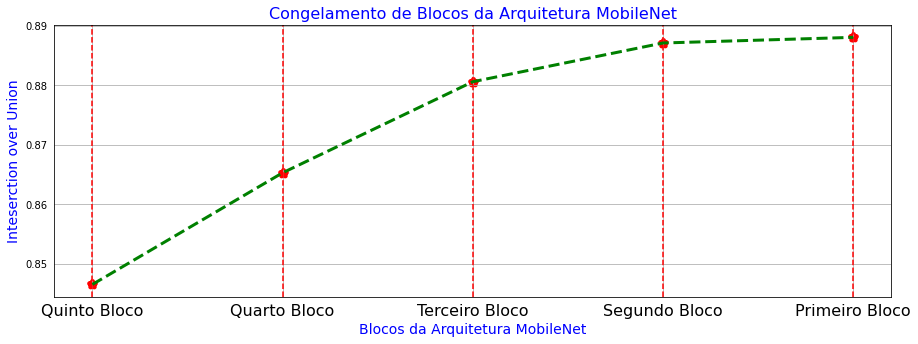

In [64]:
plt.figure(figsize = (15, 5))
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.scatter(x_labels, np.array(iou_mean_list), marker = '*', linewidths = 5, color = 'red')
for line in range(0, 5):
  plt.axvline(line, color = 'red', linestyle = '--')
plt.plot(x_labels, np.array(iou_mean_list), linestyle = '--', color = 'green', linewidth = 3)
plt.xticks(size = 16, color = 'black')
plt.yticks(color = 'black')
plt.title('Congelamento de Blocos da Arquitetura MobileNet', size = 16, color = 'blue')
plt.xlabel('Blocos da Arquitetura MobileNet', size = 14, color = 'blue')
plt.ylabel('Inteserction over Union', size = 14, color = 'blue')
plt.grid(True)

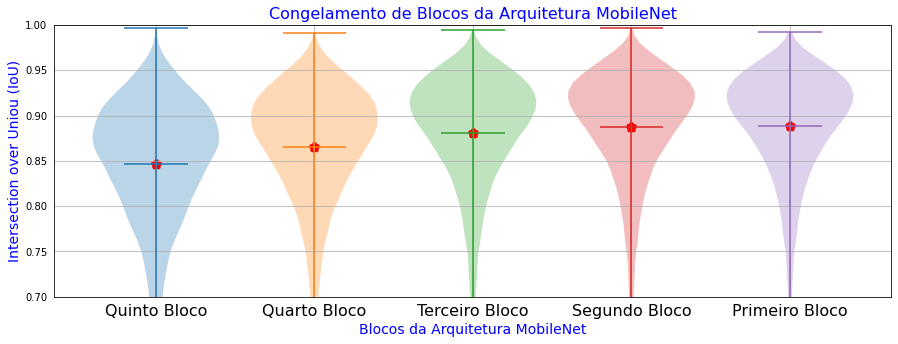

In [65]:
plt.figure(figsize = (15, 5))
plt.violinplot(iou_scores_list[0], positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[1], positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[2], positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[3], positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[4], positions = [5], showmeans = True, widths = 0.8)
plt.ylim([0.70, 1.0])
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black')
plt.yticks(color = 'black')
plt.grid(True)
plt.xlabel('Blocos da Arquitetura MobileNet', size = 14, color = 'blue')
plt.ylabel('Intersection over Uniou (IoU)', size = 14, color = 'blue')
plt.title('Congelamento de Blocos da Arquitetura MobileNet', size = 16, color = 'blue')
plt.scatter([1, 2, 3, 4, 5], np.array(iou_mean_list), marker = '*', linewidths = 5, color = 'red')

Text(0.5, 1.0, 'Congelamento de Blocos da Arquitetura MobileNet')

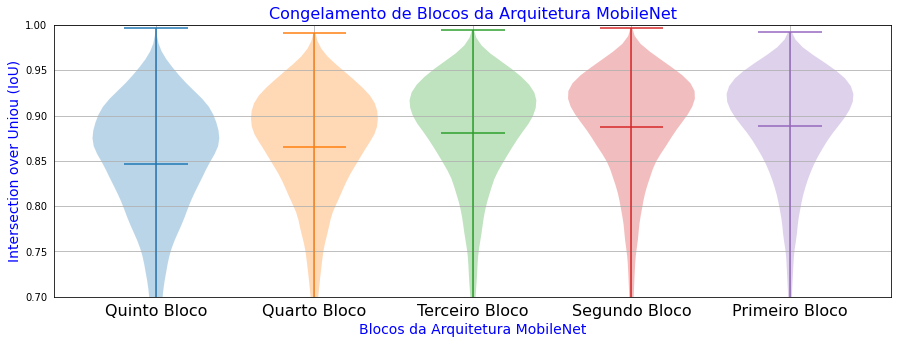

In [66]:
plt.figure(figsize = (15, 5))
plt.violinplot(iou_scores_list[0], positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[1], positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[2], positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[3], positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[4], positions = [5], showmeans = True, widths = 0.8)
plt.ylim([0.70, 1.0])
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black')
plt.yticks(color = 'black')
plt.grid(True)
plt.xlabel('Blocos da Arquitetura MobileNet', size = 14, color = 'blue')
plt.ylabel('Intersection over Uniou (IoU)', size = 14, color = 'blue')
plt.title('Congelamento de Blocos da Arquitetura MobileNet', size = 16, color = 'blue')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

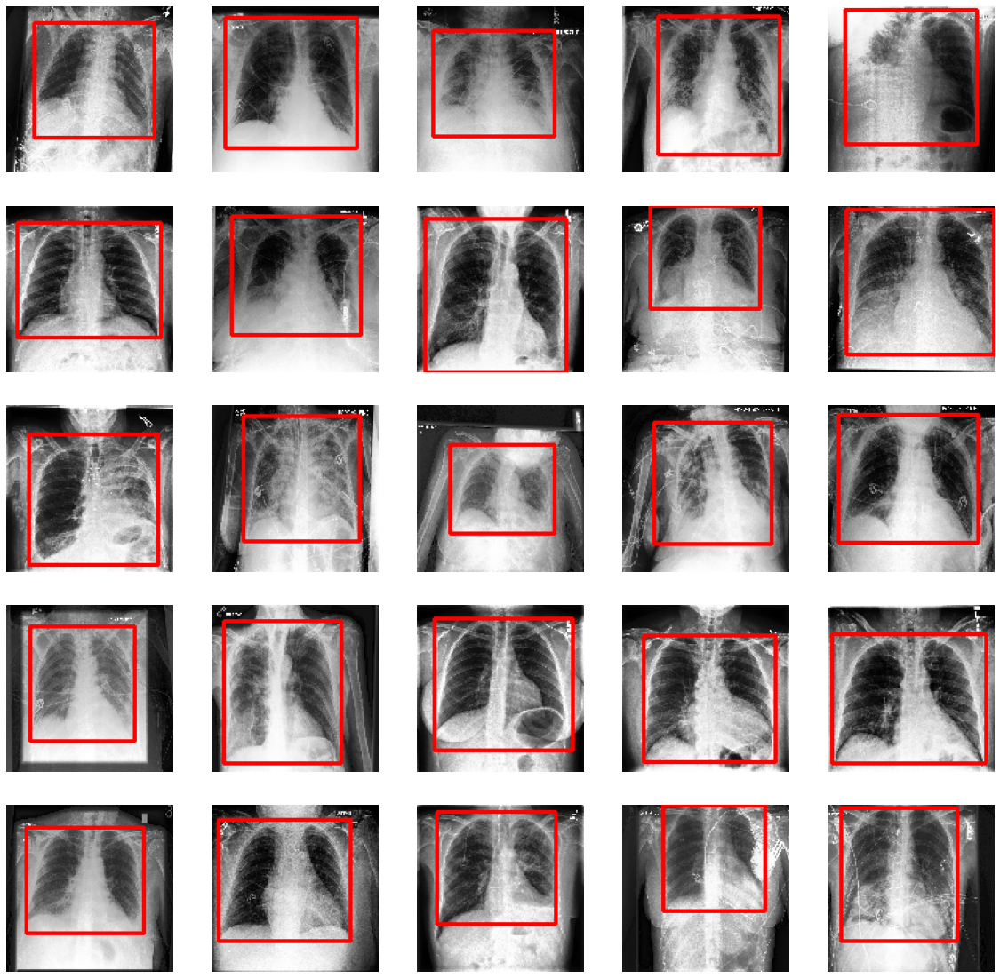

In [70]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

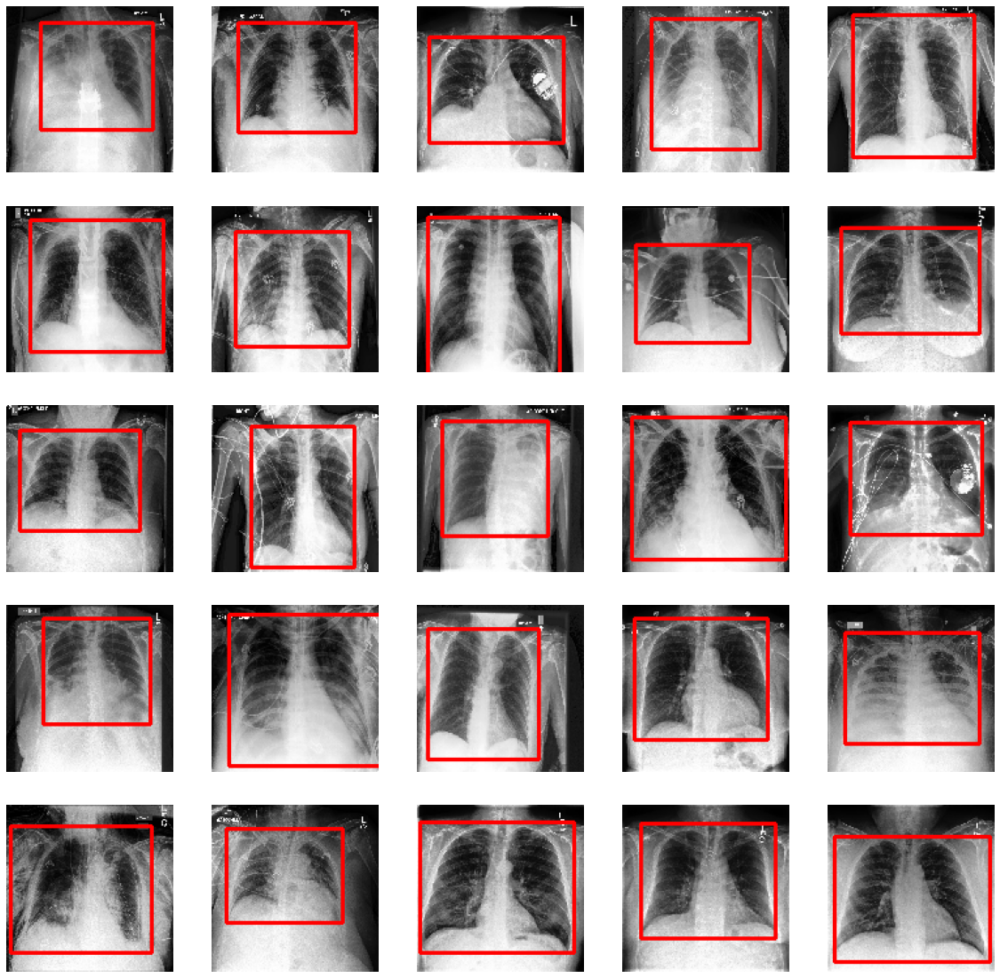

In [71]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

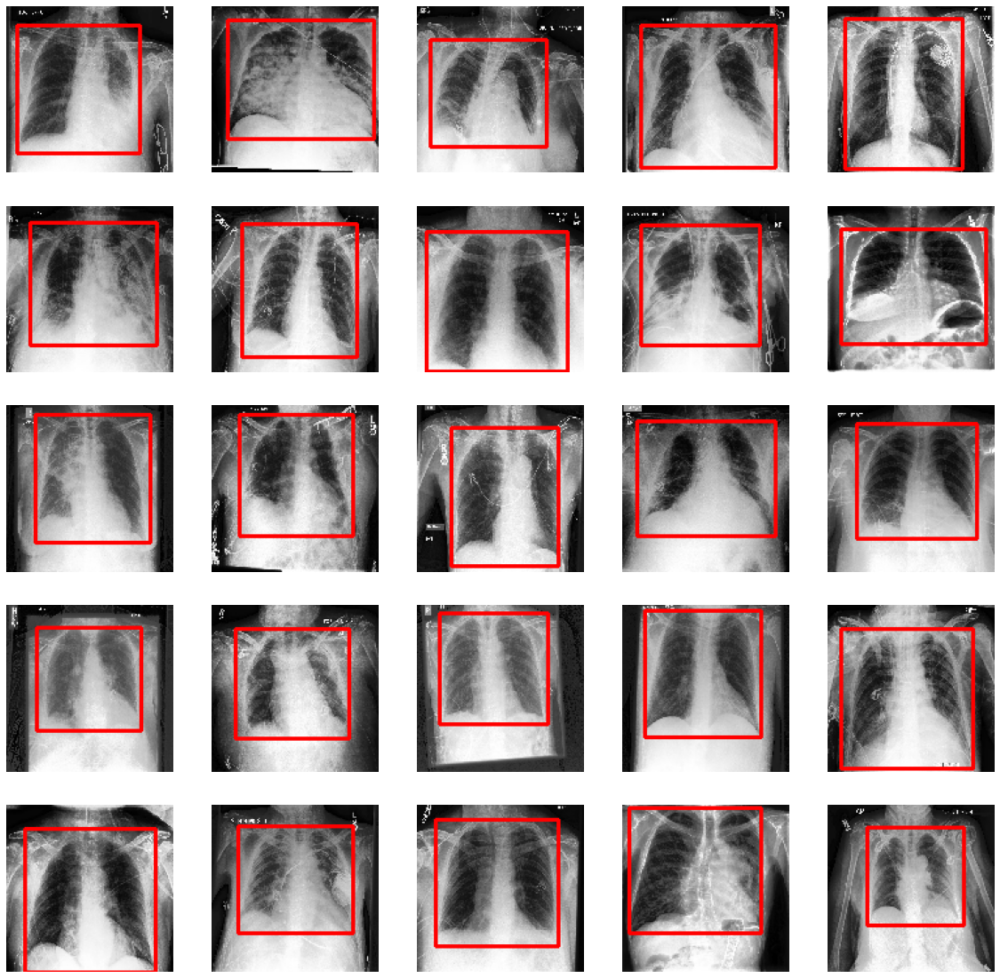

In [72]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

## 9. Comparison of Methods
***

In [75]:
plot_df = pd.read_csv('/content/plot-data-chexpert.csv', delimiter = ',', 
                      usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])

data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)

plot_generator = data_gen.flow_from_dataframe(dataframe = plot_df, directory = '', x_col = 'Path',
                                              y_col = ['p1_x', 'p1_y', 'p2_x', 'p2_y'], 
                                              target_size = (128, 128), color_mode = 'rgb', batch_size = 50,
                                              class_mode = 'raw', shuffle = False, seed = 42)

plot_x, plot_y = plot_generator[0]
plot_files = list(plot_df['Path'])

Found 50 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

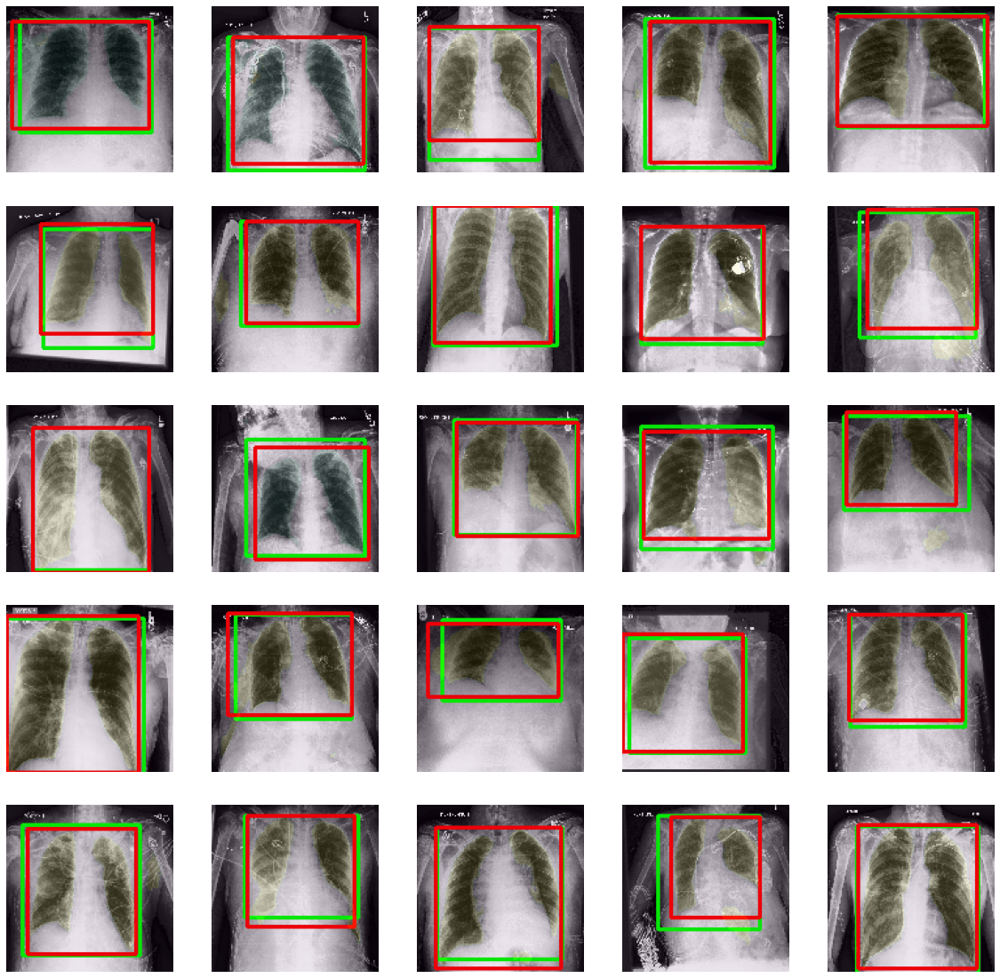

In [84]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = plot_files[count])
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(plot_x[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(img)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = plot_y[count], 
                                                 color = (255, 0, 0), thickness = 2))
    mask = bbox_utils().resize_image(image = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1]), 
                                     shape = (128, 128))
    axs[i, j].imshow(mask, alpha = 0.1)
    axs[i, j].axis('off')
    count += 1

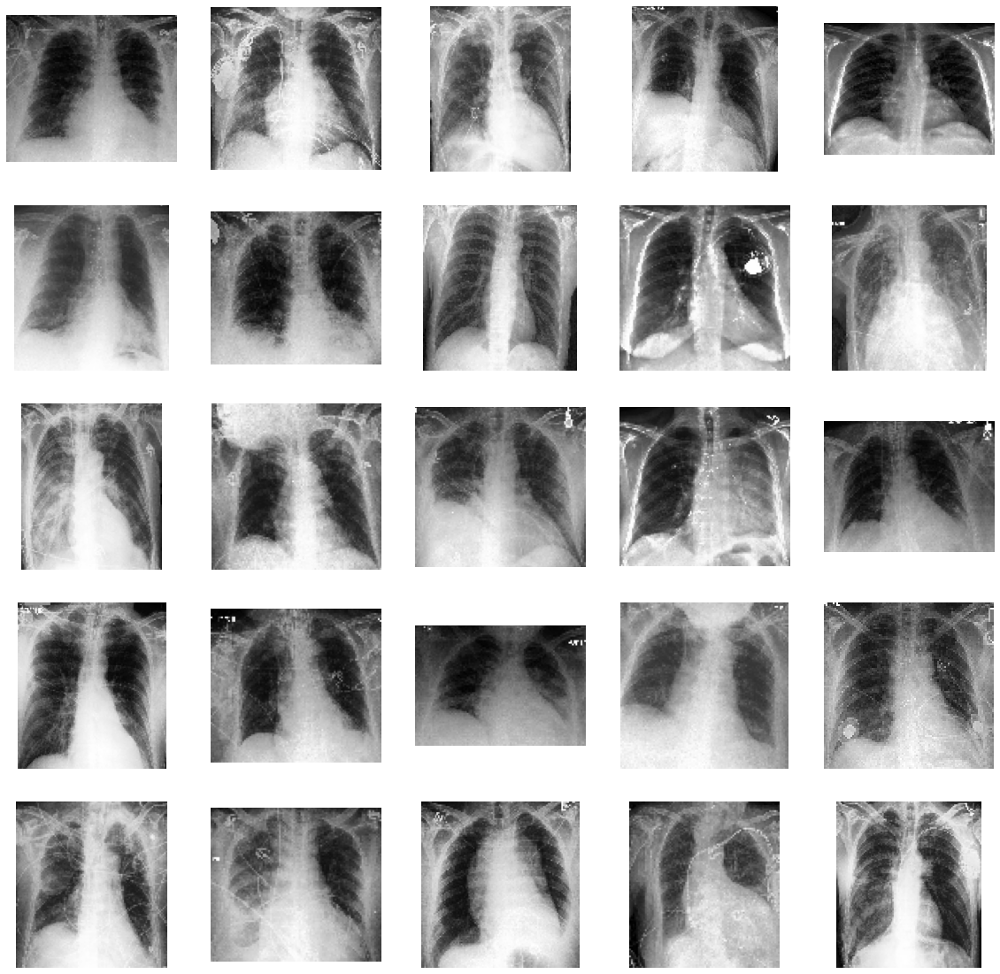

In [131]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = plot_x[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

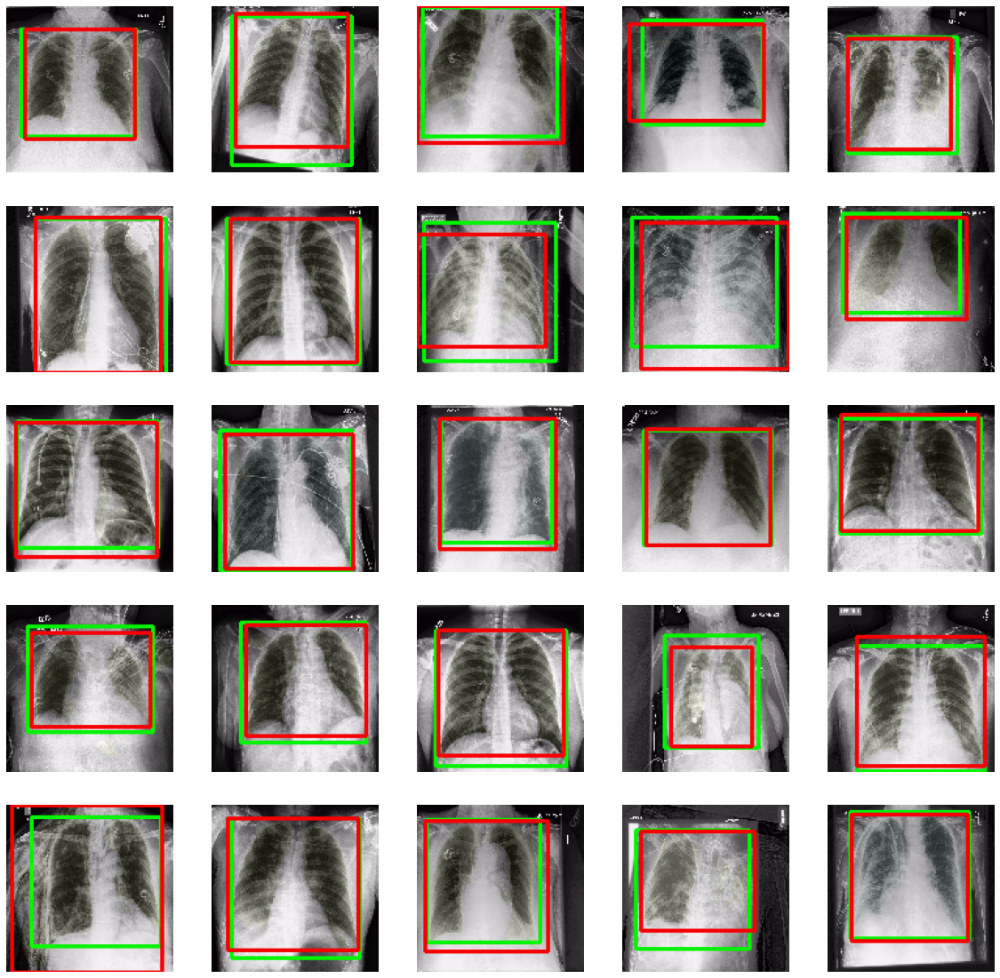

In [83]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 25
for i in range(0, 5):
  for j in range(0, 5):
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = plot_files[count])
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(plot_x[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(img)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = plot_y[count], 
                                                 color = (255, 0, 0), thickness = 2))
    mask = bbox_utils().resize_image(image = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1]), 
                                     shape = (128, 128))
    axs[i, j].imshow(mask, alpha = 0.05)
    axs[i, j].axis('off')
    count += 1

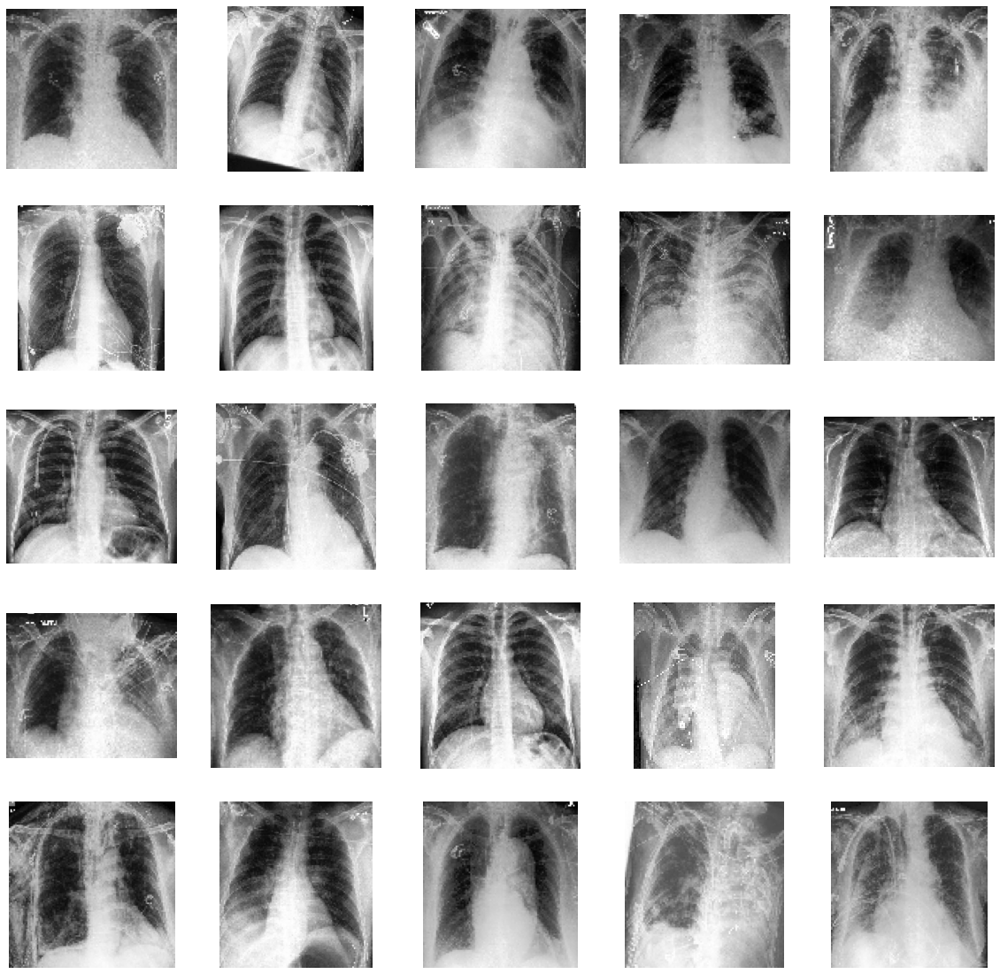

In [130]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 25
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = plot_x[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

## 10. Testing in another database
***

In [ ]:
!cp -r /content/gdrive/MyDrive/montglomery-shenzhen-datasets.zip /content/
!unzip /content/montglomery-shenzhen-datasets.zip
!rm /content/montglomery-shenzhen-datasets.zip

In [95]:
filelist_montgomery = glob.glob('/content/Montgomery/MontgomerySet/CXR_png/*.png')
filelist_shenzen = glob.glob('/content/ChinaSet_AllFiles/ChinaSet_AllFiles/CXR_png/*.png')

print('Number of Images from Montgomery Dataset:', len(filelist_montgomery), 'imagens')
print('Number of Images from Shenzhen Dataset:', len(filelist_shenzen), 'imagens')

montgomery_df = pd.DataFrame(filelist_montgomery, columns = ['Path'])
montgomery_df['Labels'] = np.zeros((len(filelist_montgomery, )))
shenzen_df = pd.DataFrame(filelist_shenzen, columns = ['Path'])
shenzen_df['Labels'] = np.zeros((len(filelist_shenzen, )))

Number of Images from Montgomery Dataset: 138 imagens
Number of Images from Shenzhen Dataset: 662 imagens


In [98]:
montgomery_generator = data_gen.flow_from_dataframe(dataframe = montgomery_df, directory = '', x_col = 'Path',
                                                    y_col = ['Labels'], target_size = (128, 128), 
                                                    color_mode = 'rgb', batch_size = 64, class_mode = 'raw', 
                                                    shuffle = False, seed = 42)

shenzen_generator = data_gen.flow_from_dataframe(dataframe = shenzen_df, directory = '', x_col = 'Path',
                                                 y_col = ['Labels'], target_size = (128, 128), 
                                                 color_mode = 'rgb', batch_size = 64, class_mode = 'raw', 
                                                 shuffle = False, seed = 42)

for i in range(0, len(montgomery_generator)):
  x, y = montgomery_generator[i]
  if i == 0:
    images_mont, labels_mont = x, y
  else:
    images_mont, labels_mont = np.concatenate((images_mont, x)), np.concatenate((labels_mont, y))

for i in range(0, len(shenzen_generator)):
  x, y = shenzen_generator[i]
  if i == 0:
    images_shen, labels_shen = x, y
  else:
    images_shen, labels_shen = np.concatenate((images_shen, x)), np.concatenate((labels_shen, y))

Found 138 validated image filenames.
Found 662 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

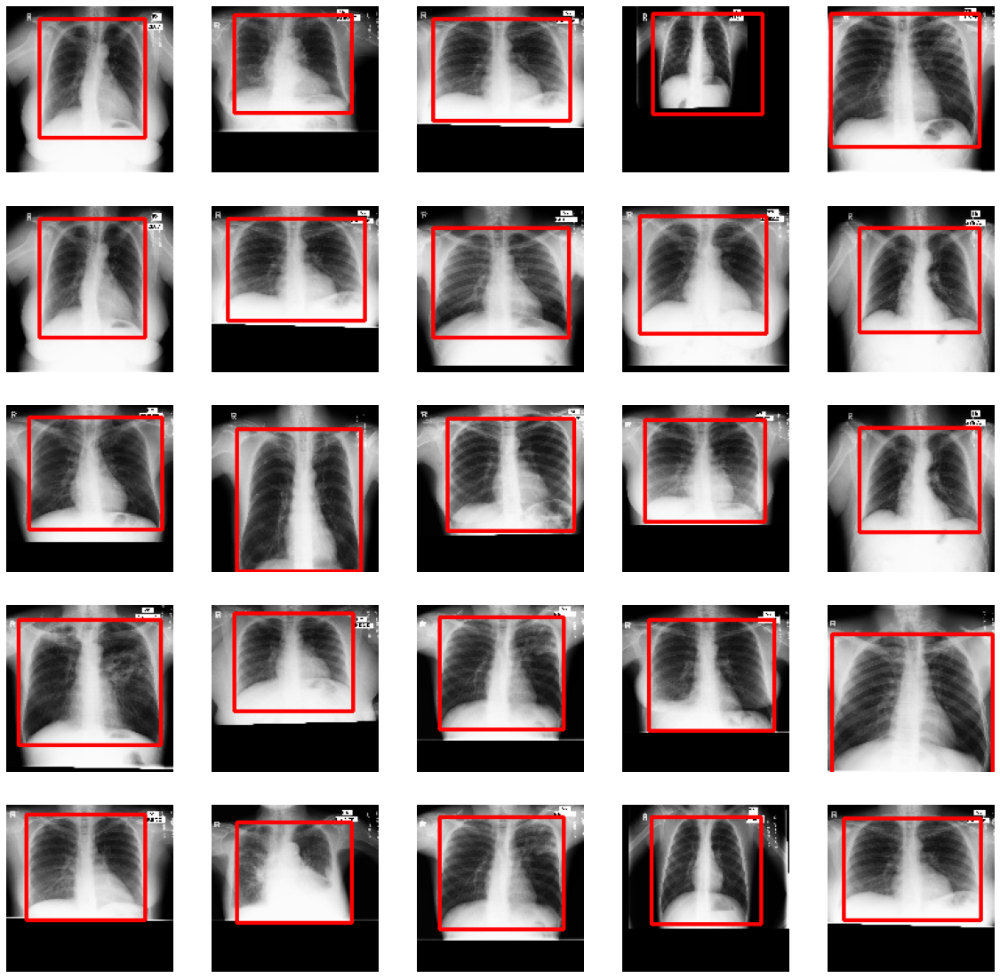

In [99]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_mont))
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_mont[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

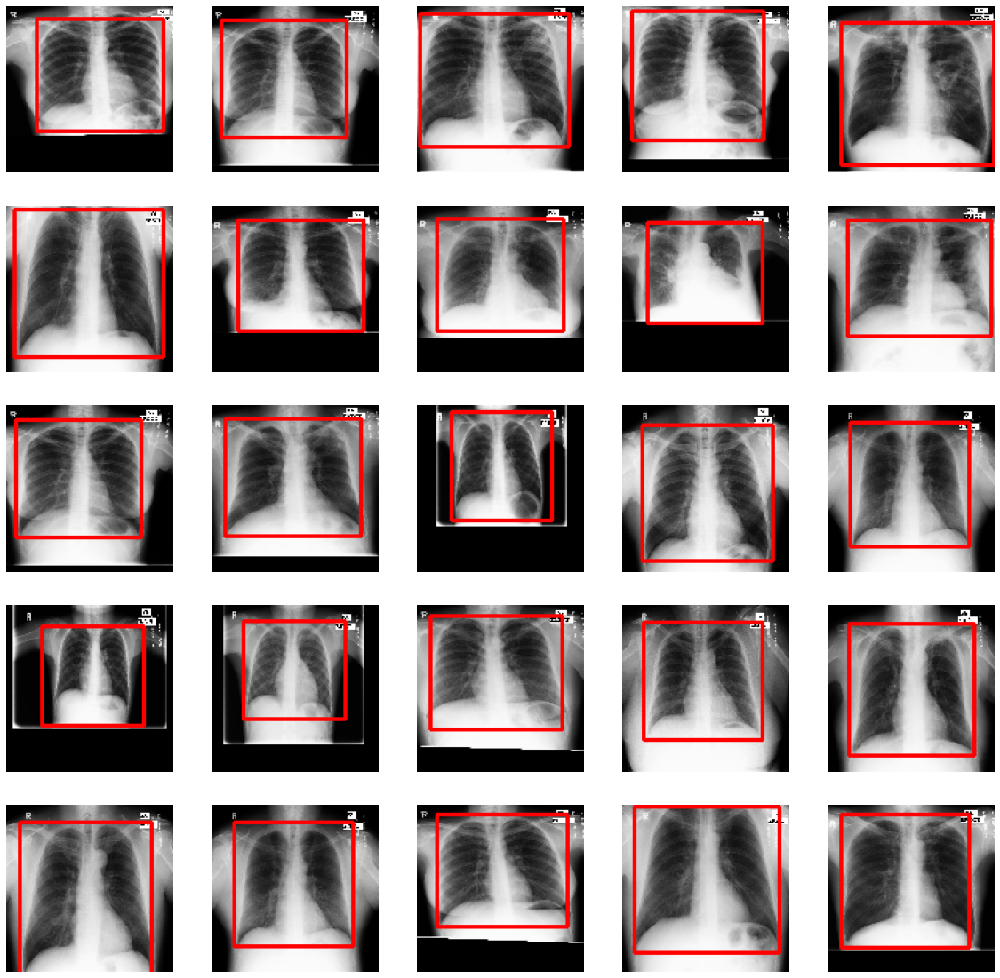

In [100]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_mont))
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_mont[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

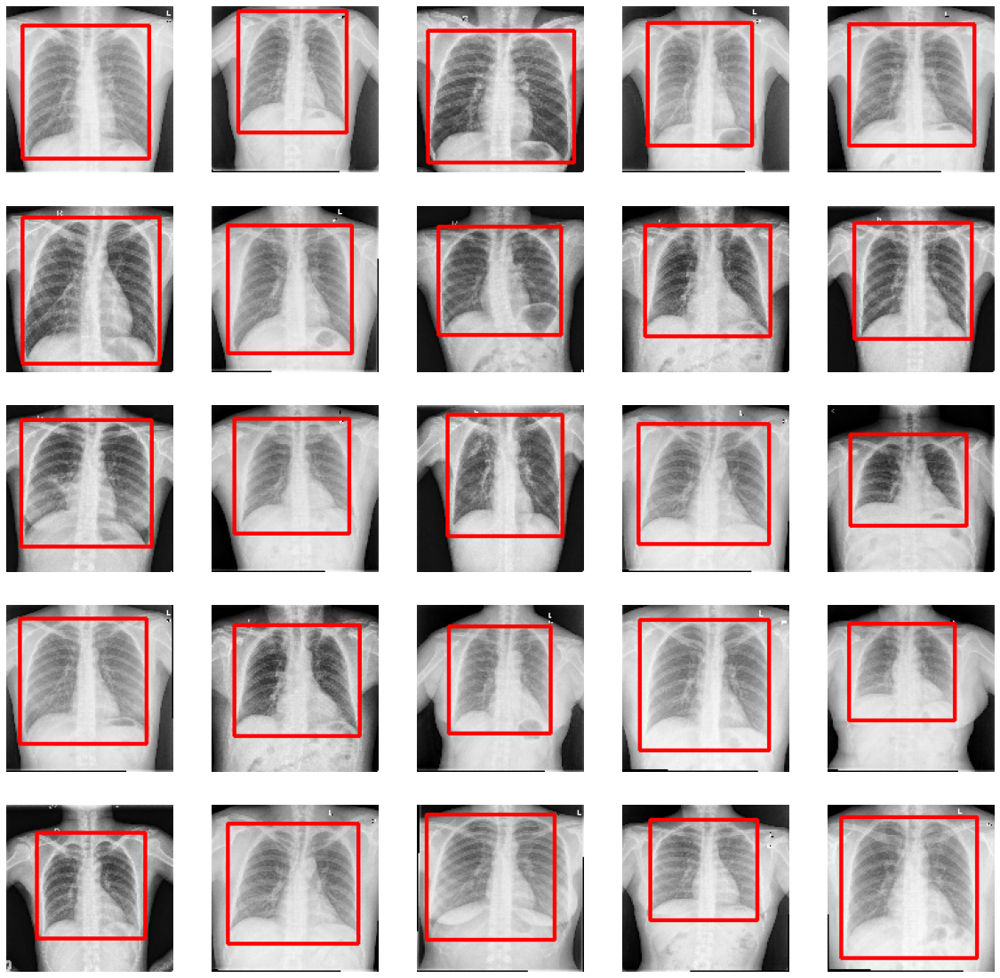

In [101]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_shen))
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_shen[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

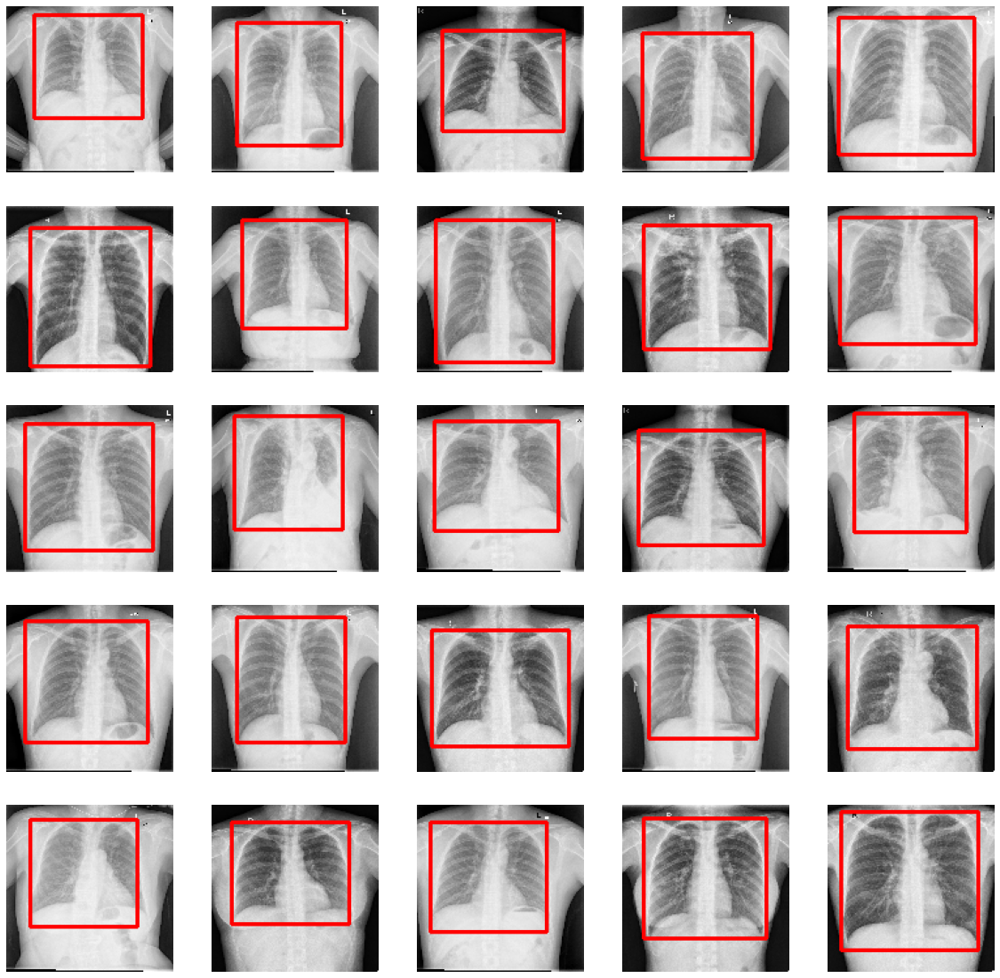

In [102]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_shen))
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_shen[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

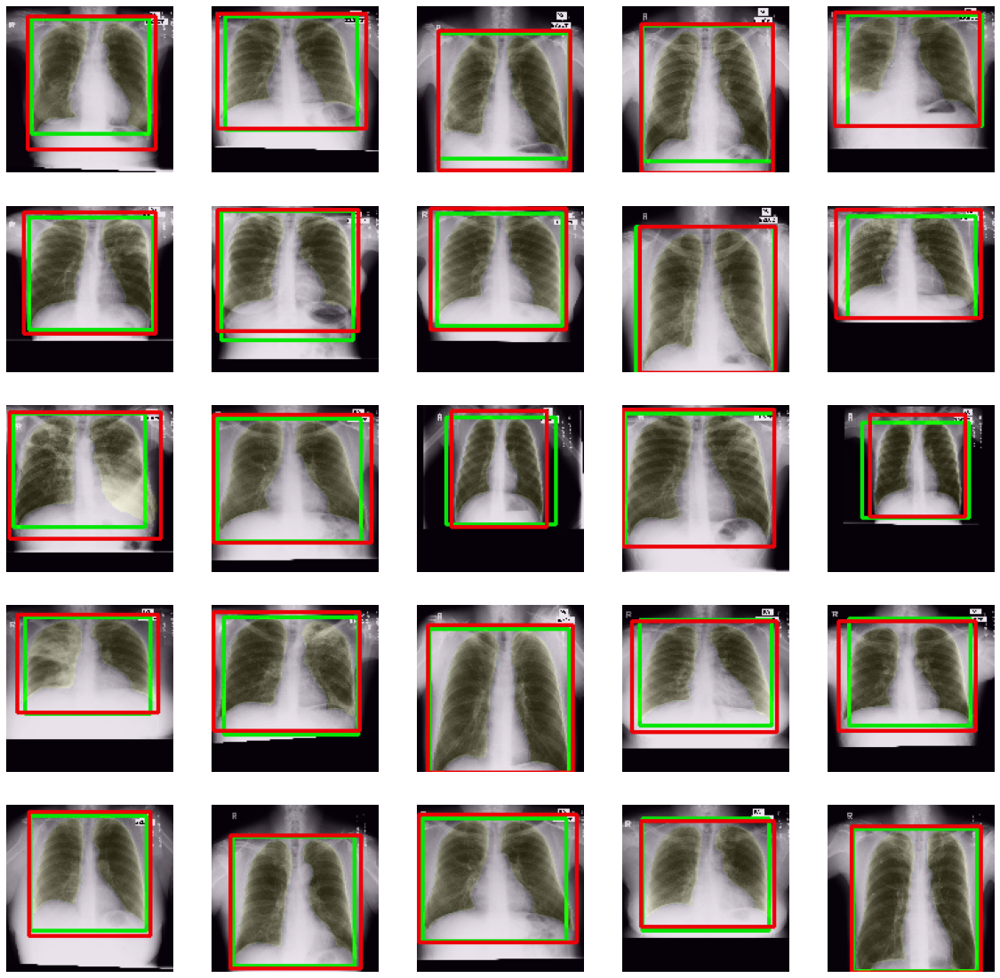

In [128]:
mem_count = list()
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(filelist_montgomery))
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = filelist_montgomery[count])
    original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
    contours = bbox_utils().get_contours(mask = original_mask.copy())
    mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours = contours), 
                                               image_shape = img.shape)
    list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(images_mont[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = list_coordinates, 
                                                 color = (255, 0, 0), thickness = 2))
    original_mask = bbox_utils().resize_image(image = original_mask, shape = (128, 128))
    axs[i, j].imshow(original_mask, alpha = 0.1)
    axs[i, j].axis('off')
    mem_count.append(count)

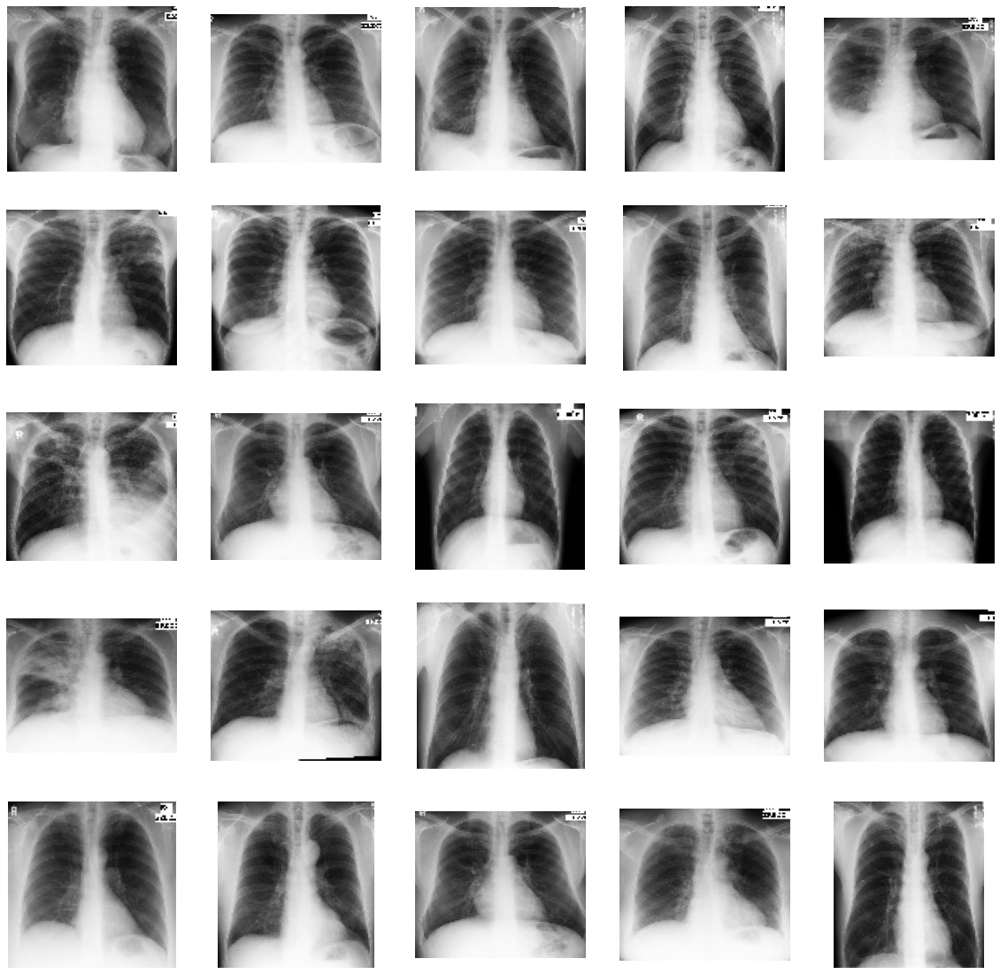

In [129]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(images_mont[mem_count[count]], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = images_mont[mem_count[count]], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

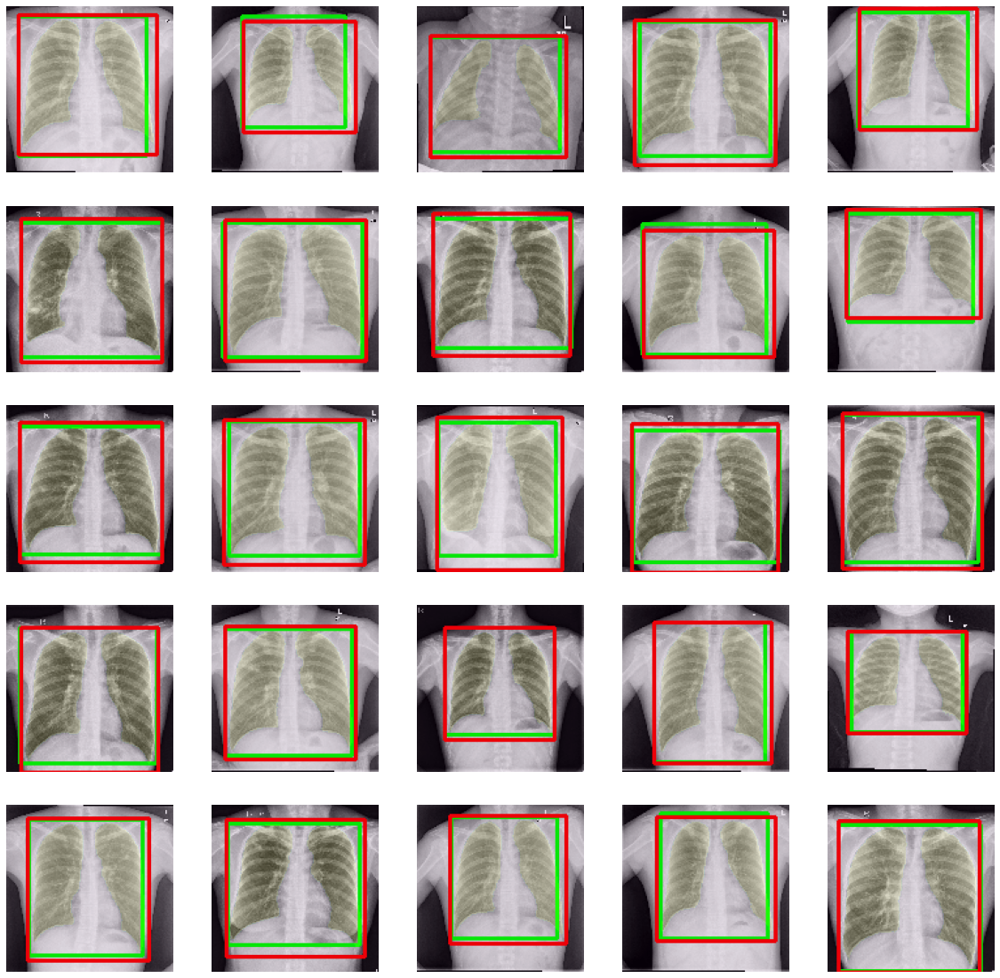

In [118]:
mem_count = list()
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(filelist_shenzen))
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = filelist_shenzen[count])
    original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
    contours = bbox_utils().get_contours(mask = original_mask.copy())
    mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours = contours), 
                                               image_shape = img.shape)
    list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(images_shen[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = list_coordinates, 
                                                 color = (255, 0, 0), thickness = 2))
    original_mask = bbox_utils().resize_image(image = original_mask, shape = (128, 128))
    axs[i, j].imshow(original_mask, alpha = 0.1)
    axs[i, j].axis('off')
    mem_count.append(count)

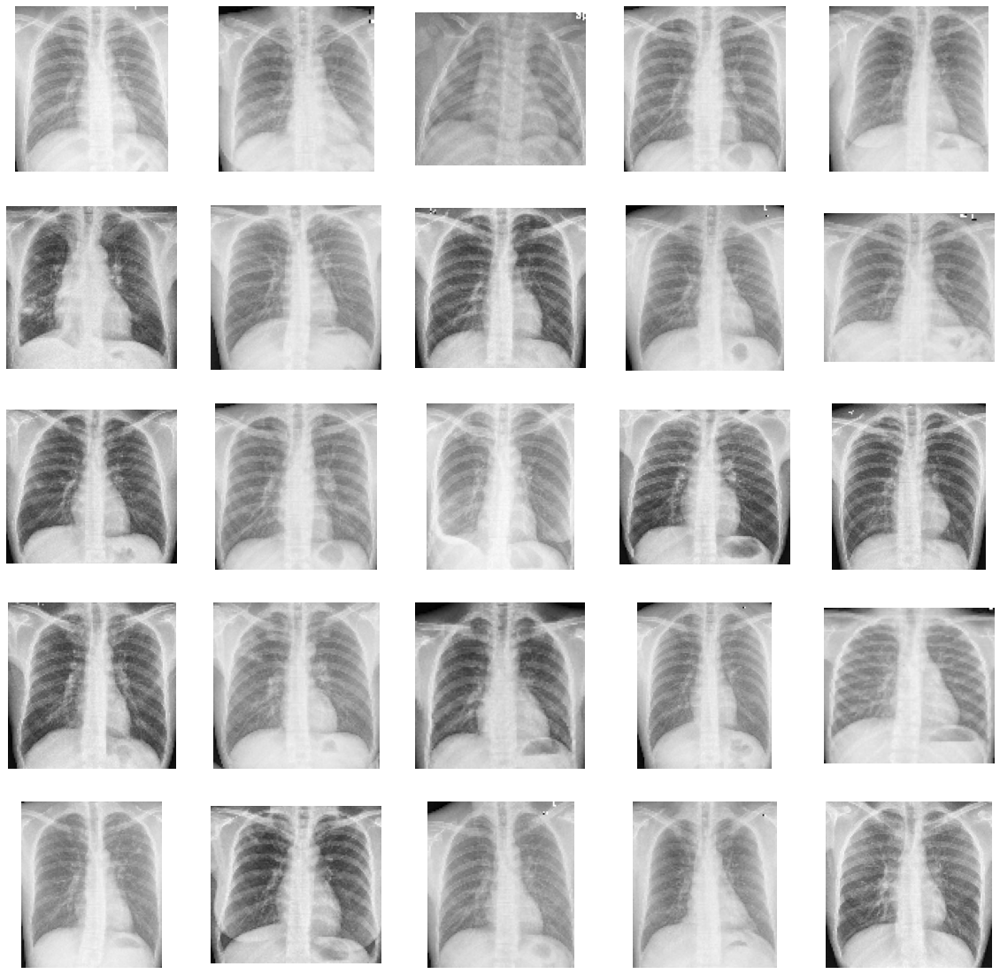

In [127]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(images_shen[mem_count[count]], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = images_shen[mem_count[count]], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

## 11. Comparação de Tempo de Inferência
***

In [135]:
start_time = time.time()
coordinates_list = list()
for image in plot_files:
  img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = image)
  original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
  list_coordinates = bbox_utils().extract_coordinates(mask = original_mask)
  coordinates_list.append(list_coordinates)
end_time = time.time()

print('Pulmonary Segmentation')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Pulmonary Segmentation
Runtime: 29.457 milliseconds


In [136]:
start_time = time.time()
coordinates_list = list()
for image in plot_files:
  img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = image)
  original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
  contours = bbox_utils().get_contours(mask = original_mask.copy())
  mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours =contours), 
                                             image_shape = img.shape)
  list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
  coordinates_list.append(list_coordinates)

end_time = time.time()

print('Pulmonary Segmentation + Image Processing')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Pulmonary Segmentation + Image Processing
Runtime: 48.832 milliseconds


In [138]:
start_time = time.time()
for image in plot_files:
  coordinates_list  = model.predict(plot_x)
end_time = time.time()

print('Convolutional Neural Networks')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Convolutional Neural Networks
Runtime: 1.409 milliseconds


|**Method**|**Inference Time (milliseconds)**|
|:-|:-:|
|Pulmonary Segmentation|29.457|
|Pulmonary Segmentation + Image Processing|48.832|
|Convolutional Neural Networks|1.409|